In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import sin, sinh, pi, sum, exp

**1.** Encontre a solução do problema de condução de calor

$$
\begin{aligned}
& 100 u_{x x}=u_t, \quad 0<x<1, \quad t>0 \\
& u(0, t)=0, \quad u(1, t)=0, \quad t>0 \\
& u(x, 0)=\operatorname{sen}(2 \pi x)-\operatorname{sen}(5 \pi x), \quad 0 \leq x \leq 1
\end{aligned}
$$

*Solução:* A solução analítica é dada por

$$
u(x, t)=\sum_{n=1}^{\infty} c_n u_n(x, t)=\sum_{n=1}^{\infty} c_n e^{-n^2 \pi^2 \alpha^2 t / L^2} \operatorname{sen}\left(\frac{n \pi x}{L}\right),
$$

com 
 
$$
c_n=\frac{2}{L} \int_0^L f(x) \operatorname{sen}\left(\frac{n \pi x}{L}\right) d x
$$

In [7]:
import sympy as sp
sp.init_printing()

In [8]:
x, y = sp.symbols('x, y')
n = sp.symbols('n', integer=True, positive = True)

In [9]:
L = 1

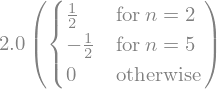

In [10]:
cn = (2/L)*sp.integrate((sp.sin(2*sp.pi*x)-sp.sin(5*sp.pi*x))*sp.sin(n*x*sp.pi/L),(x,0,L))
cn

In [11]:
cn = sp.lambdify(n,cn)

In [12]:
import numpy as np
import matplotlib.pyplot as plt

In [43]:
# definindo uma aproximação para a solução analítica com n_max termos
def u_aprox(x, t):
  soma = 0
  for n in range(1, 100):
    soma += cn(n)*np.exp(-(n**2*np.pi*10/L)**2*t)*np.sin(n*np.pi*x/L)
  return soma

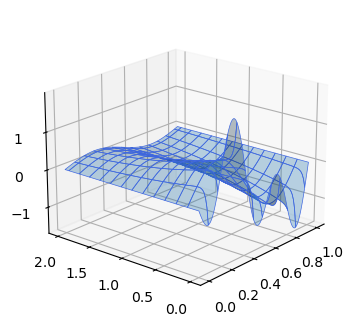

In [44]:
# definindo as coordenadas dos pontos do gráfico
x = np.linspace(0, L, 100)
t = np.linspace(0, 0.0001, 100)
xx, tt = np.meshgrid(x, t)
zz = u_aprox(xx, tt)

# plotando a superfície 3D
ax = plt.figure(figsize=(4, 4)).add_subplot(projection='3d')
ax.plot_surface(xx, yy, zz, edgecolor='royalblue', lw=0.5, 
                rstride=8, cstride=8, alpha=0.3)
ax.view_init(20, -140)
plt.show()

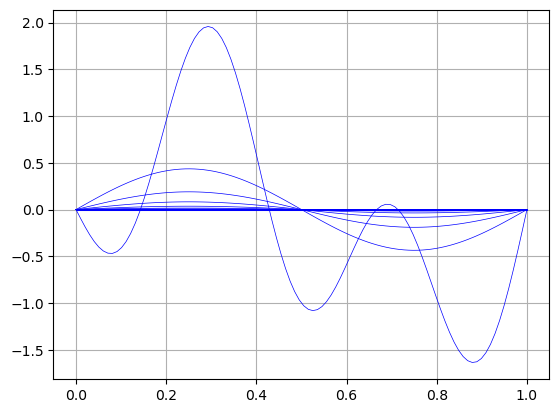

In [48]:
x = np.linspace(0,1,100)
for t in np.linspace(0,0.001,20):
    plt.plot(x, [u_aprox(xi,t) for xi in x],
             color ='b', linewidth = 0.5)
plt.grid()

In [73]:
L = 1 
dx = 0.1    # cm
# Coordenada dos pontos
xi = np.arange(0, L+dx, dx)
T = [np.zeros(len(xi))]


In [96]:
k = 10
dt = 0.000005     # seg

lamb = k*(dt/dx**2) 
print("Lambda=", lamb)

Lambda= 0.5


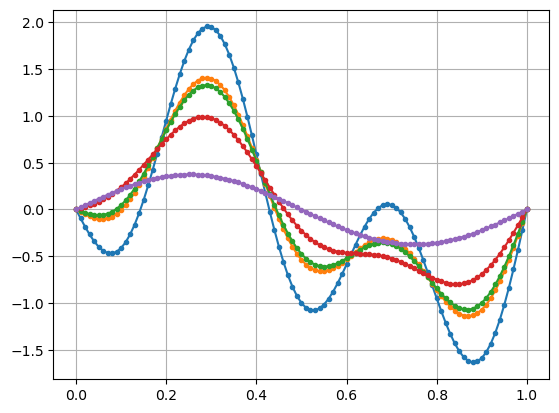

In [97]:
# Temperaturas em cada instante
# (lista para armazenar os dados)# Estado inicial
T0 = np.sin(2*np.pi*xi)-np.sin(5*np.pi*xi)

# Condições de contorno
T0[0] = 0.
T0[-1] = 0.
#print(T0)
T = [T0]

# Calculando
for t in np.linspace(0,0.01,500):
    Tb = T[-1].copy() 
    Tf = T[-1].copy()
    Tf[1:-1] = Tb[1:-1]+lamb*(Tb[2:]-2*Tb[1:-1]+Tb[0:-2])
    T.append(Tf)

#print(T[0][1:-1])
#print(T[1][1:-1])   
#print(T[2][1:-1])   
#print(T[3][1:-1])
#plt.figure(figsize=(4,2))
plt.plot(xi, T[0],'.-')
plt.plot(xi, T[50],'.-')
plt.plot(xi, T[60],'.-')
#plt.plot(xi, T[90],'.-')
plt.plot(xi, T[120],'.-')
plt.plot(xi, T[499],'.-')
plt.grid()

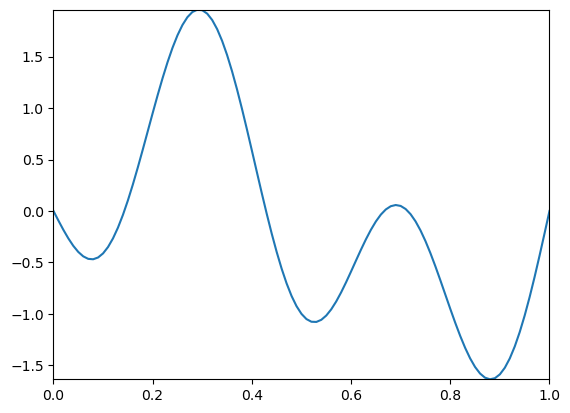

In [99]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

T = np.array(T)

fig, ax = plt.subplots()
line, = ax.plot([], [])
ax.set_xlim(0, 1)
ax.set_ylim(T.min(), T.max())

def update(frame):
    line.set_data(xi, T[frame])
    return line,

ani = FuncAnimation(fig, update, frames=T.shape[0], 
                    interval=100, blit=False)
HTML(ani.to_jshtml())

**2.** Encontre a temperatura $u(x, t)$ numa barra de cobre de 80 cm de comprimento e isolada lateralmente, considerando que a temperatura inicial seja de $100 \operatorname{sen}(\pi x / 80)^{\circ} \mathrm{C}$ e que extremidades estejam mantidas a $0^{\circ} \mathrm{C}$. Quanto tempo será necessário para que a temperatura máxima caia a $50^{\circ} \mathrm{C}$?
Dados físicos sobre o cobre: massa específica $8,92 \mathrm{gm} / \mathrm{cm}^3$, calor específico 0,092 $\mathrm{cal} /\left(\mathrm{gm}^{\circ} \mathrm{C}\right)$, condutividade térmica $0,95 \mathrm{cal} /\left(\mathrm{cm} \mathrm{s}{ }^{\circ} \mathrm{C}\right)$.

**_Solução:_** A condição inicial fornece

$$
u(x, 0)=\sum_{n=1}^{\infty} B_n \operatorname{sen} \frac{n \pi x}{80}=f(x)=100 \operatorname{sen} \frac{\pi x}{80}
$$


Logo, obtemos $B_1=100, B_2=B_3=\cdots=0$. Precisamos de $\lambda_1{ }^2=c^2 \pi^2 / L^2$, onde $c^2=K /(\sigma \rho)=0,95 /(0,092 \times 8,92)=1,158\left[\mathrm{~cm}^2 / \mathrm{s}\right]$. Portanto, obtemos

$$
\lambda_1^2=1,158 \cdot 9,870 / 80^2=0,001785\left[\mathrm{~s}^{-1}\right]
$$


A solução é

$$
u(x, t)=100 \operatorname{sen} \frac{\pi x}{80} e^{-0,001785 t}
$$


Além disso, $100 e^{-0,001785 t}=50$ quando $t=(\ln 0,5) /(-0,001785)=388[\mathrm{~s}] \approx 6,5[\mathrm{~min}]$. 

Vamos fazer o gráfico usando Python.

In [105]:
L = 80; nx = 80
x_mesh, y_mesh = np.meshgrid(np.linspace(0,L,nx+1),np.linspace(0,1,2))
xi = np.linspace(0,L,nx+1)
u = lambda x,t: 100*np.sin(np.pi*x/80)*np.exp(-0.001785*t)

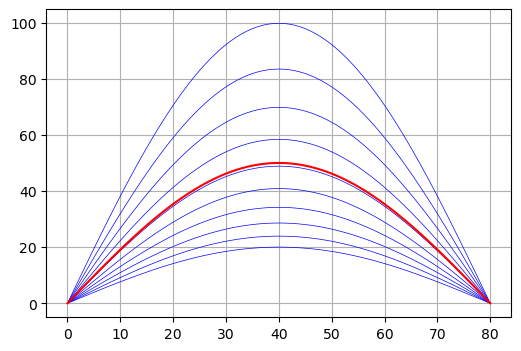

In [106]:
fig, ax = plt.subplots(figsize=(6, 4))
for t in range(1,1000,100):
    plt.plot(xi,u(xi,t), color='b', lw=0.5)
plt.plot(xi,u(xi,388), color='r')
plt.grid()
plt.show()

**2.** A temperatura numa barra de comprimento $L$, lateralmente isolada e cujas extremidades são mantidas numa temperatura 0 , supondo que a temperatura inicial seja

$$
f(x)=\left\{\begin{array}{ccc}
x & \text { se } & 0<x<L / 2, \\
L-x & \text { se } & L / 2<x<L .
\end{array}\right.
$$

é dada pela função (solução analítica)

$$
u(x, t)=\frac{4 L}{\pi^2}\left[\operatorname{sen} \frac{\pi x}{L} \exp \left[-\left(\frac{c \pi}{L}\right)^2 t\right]-\frac{1}{9} \operatorname{sen} \frac{3 \pi x}{L} \exp \left[-\left(\frac{3 c \pi}{L}\right)^2 t\right]+-\cdots\right] .
$$

Vamos plotar a solução para alguns valores de $t$ considerando os dados do exercício anterior.

In [112]:
from numpy import pi, sin, exp

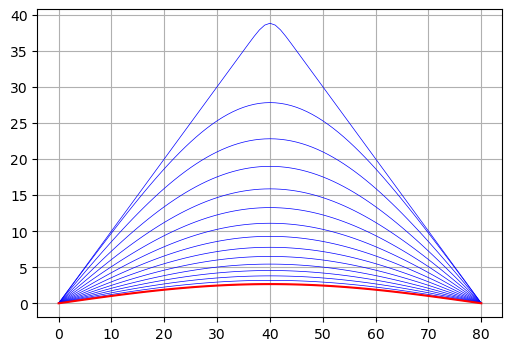

In [113]:
L = 80; nx = 80
xi = np.linspace(0,L,nx+1)
c = np.sqrt(1.158)
def u(xi,t,nmax): #xi é um vetor
    soma = 0
    sinal = 1
    for n in range(1,nmax+1,2):
        soma += (4*L/pi**2)*(sinal/n**2)*sin(n*pi*xi/L)*exp(-(n*c*pi/L)**2*t)
        sinal = sinal*(-1)
    return soma

fig, ax = plt.subplots(figsize=(6, 4))
for t in range(1,1500,100):
    plt.plot(xi,u(xi,t,100), color='b', lw=0.5)
plt.plot(xi,u(xi,t,100), color='r')
plt.grid()
plt.show()

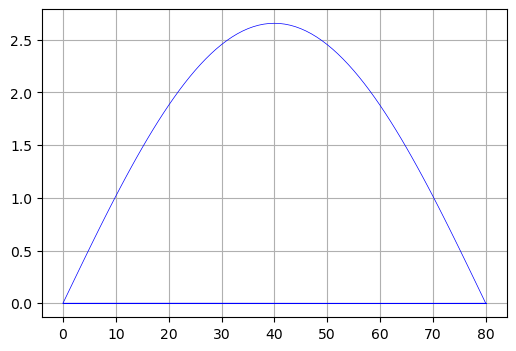

In [114]:
fig, ax = plt.subplots(figsize=(6, 4))
for n in range(1,20):
    sinal = 1
    u = (4*L/pi**2)*(sinal/n**2)*sin(n*pi*xi/L)*exp(-(n*c*pi/L)**2*t)
    sinal = sinal*(-1)
    plt.plot(xi,u, color='b', lw=0.5)
#plt.plot(xi,xi,u(xi,2,nmax), color='r')
plt.grid()
plt.show()

#### Tentativa de animação não muito bem sucedida

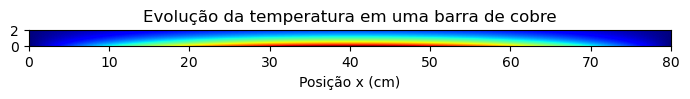

In [6]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Solução analítica
u = lambda x, t: 100 * np.sin(np.pi * x / 80) * np.exp(-0.001785 * t)

# Domínio
x = np.linspace(0, 80, 200)
t_values = np.linspace(0, 1000, 200)
X, T = np.meshgrid(x, t_values)
U = u(X, T)

# Figura
fig, ax = plt.subplots(figsize=(7, 4))
ax.set_xlabel("Posição x (cm)")
ax.set_title("Evolução da temperatura em uma barra de cobre")

heatmap = ax.imshow(U[0:2, :],
                    extent=[0, 80, 0, 2],
                    #aspect='auto',
                    origin='lower',
                    cmap='jet',
                    vmin=0, vmax=100)

#cbar = plt.colorbar(heatmap, ax=ax, label="Temperatura (°C)")

def update(frame):
    heatmap.set_data(U[:frame, :])
    return [heatmap]

ani = FuncAnimation(fig, update, frames=len(t_values),
                    interval=60, blit=True)

plt.tight_layout()

## Mostra a animação dentro do Jupyter
HTML(ani.to_jshtml())
